# Data Excersise 4.1

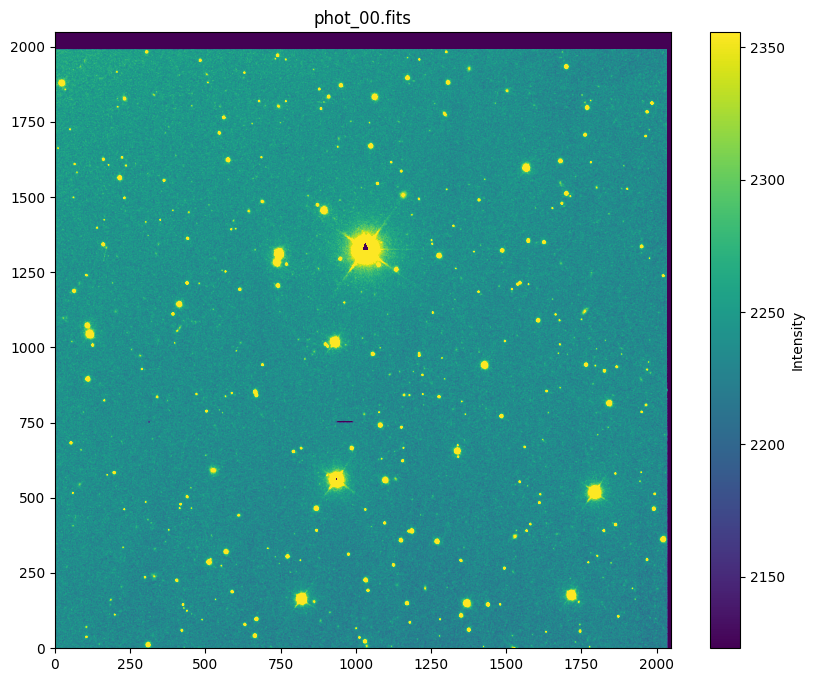

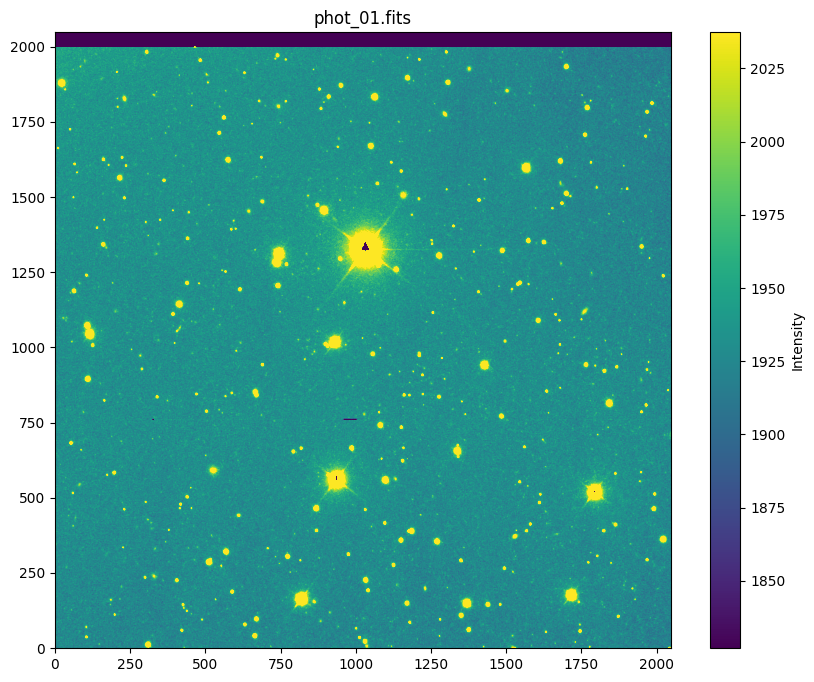

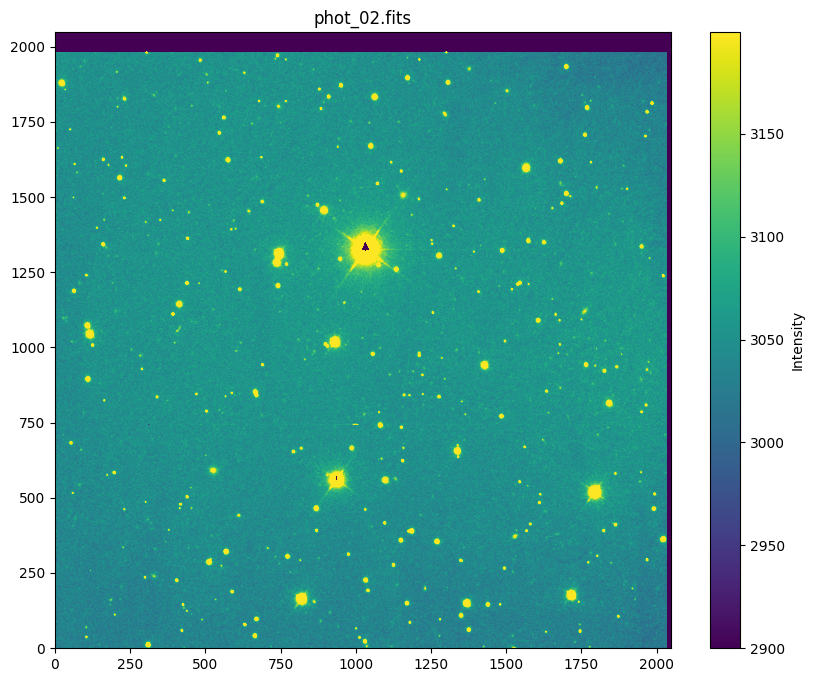

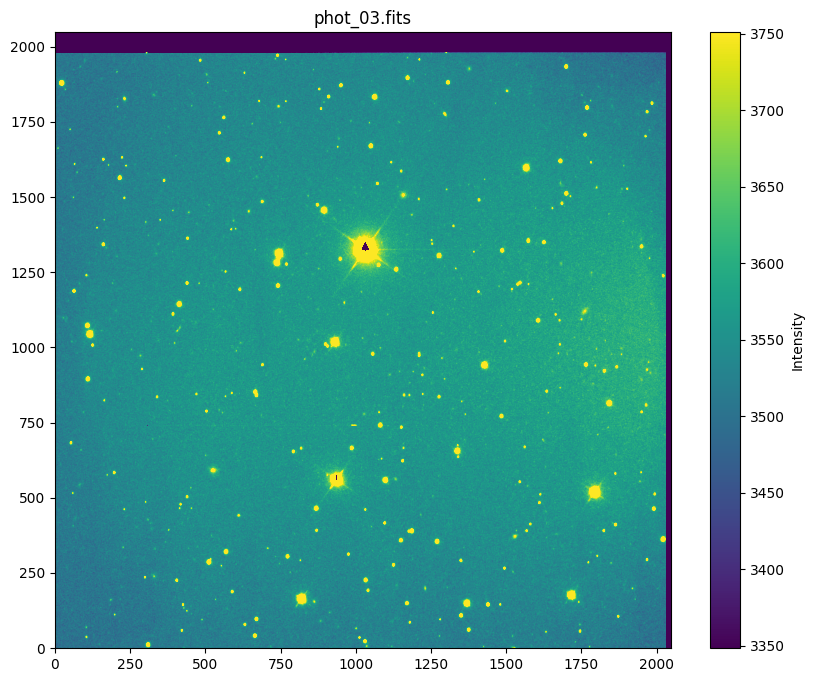

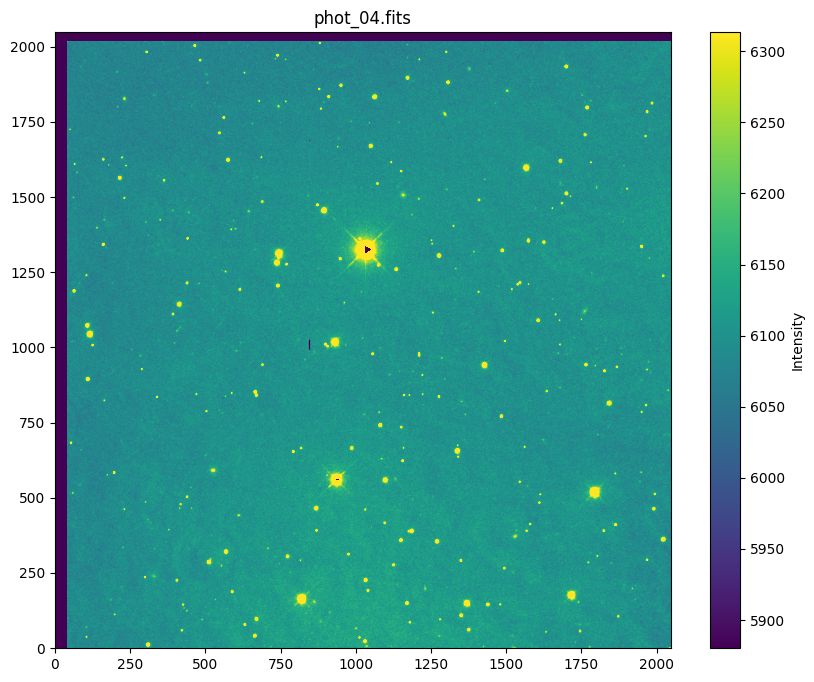

...

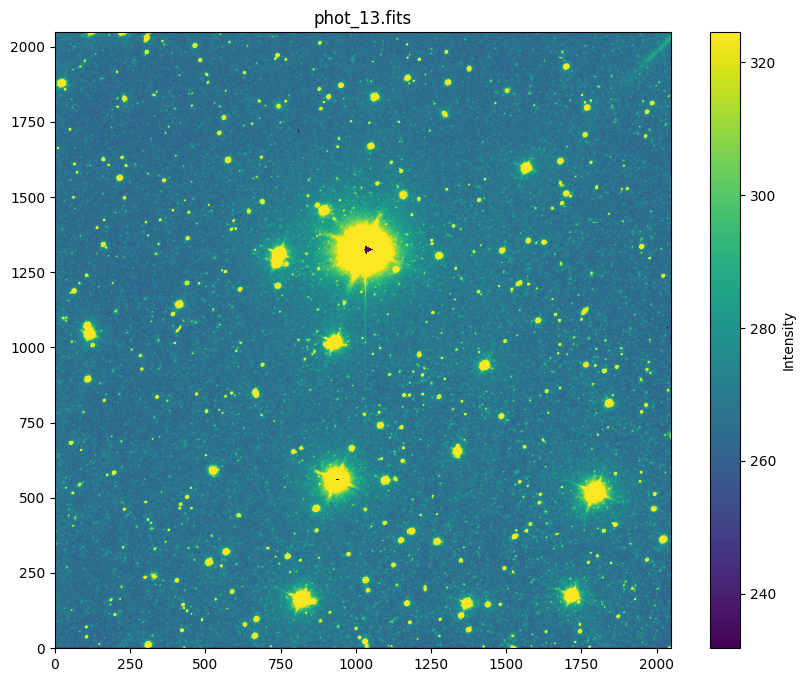

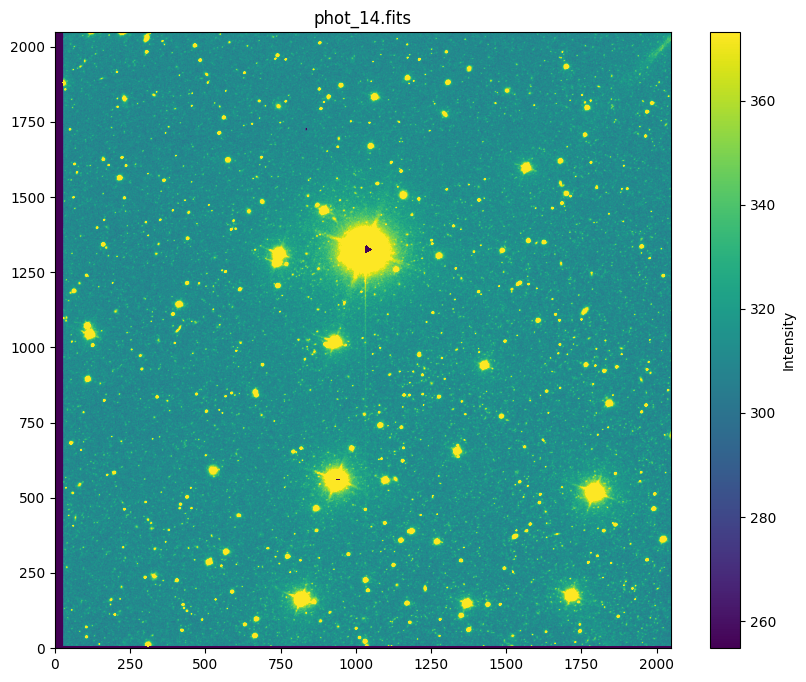

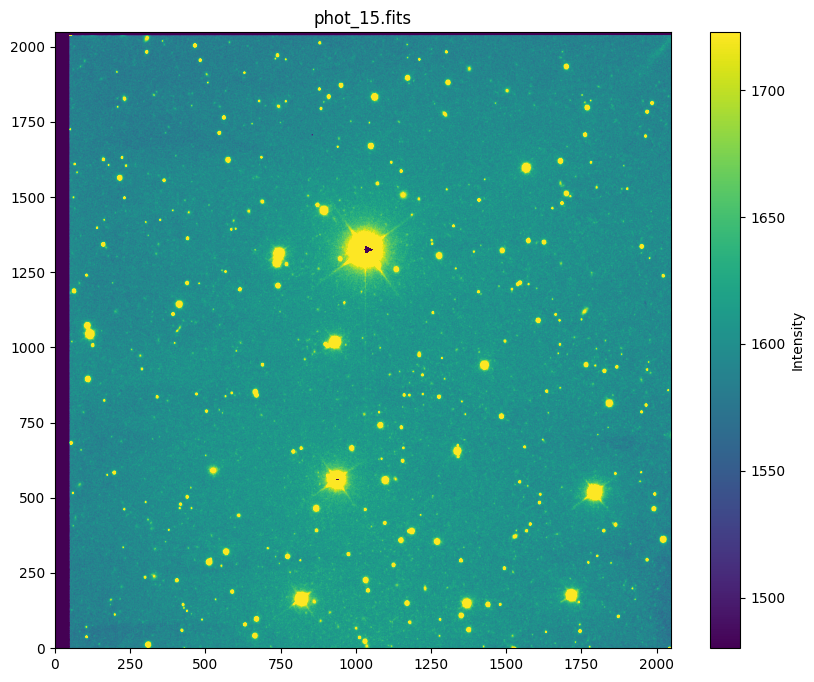

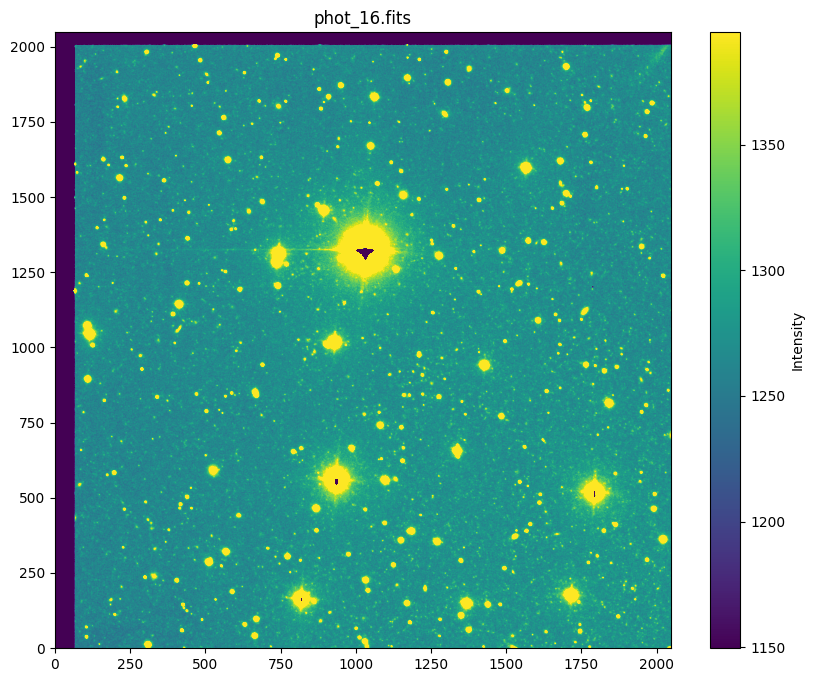

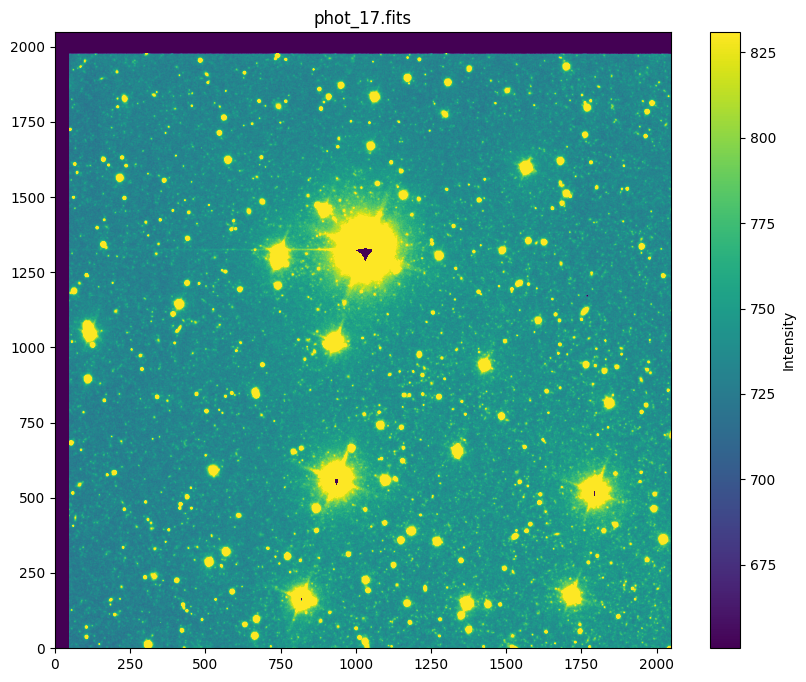

In [2]:
import astropy
from astropy.io import fits
from astropy.visualization import (ImageNormalize, ZScaleInterval, LinearStretch, LogStretch, AsinhStretch,
                                   PowerStretch, SqrtStretch)
import matplotlib.pyplot as plt
from matplotlib.widgets import Cursor
import numpy as np
import os

# --- Config (Same as before) ---
wd = r"C:\Users\friesco\workstation\fr-p\studies\ASTRO716\data_excercise"
plt.rcParams['figure.figsize'] = [10, 8]

# --- Functions ---

def explore_image_interactively(image_data, title="Image", cmap='viridis'):
    """
    Displays an image with interactive contrast adjustment and pixel value inspection.

    Args:
        image_data (np.ndarray): The image data array.
        title (str): The title of the plot.
        cmap (str): The colormap to use (e.g., 'gray', 'viridis', 'plasma').
    """

    # Create the figure and axes
    fig, ax = plt.subplots()

    # Initial display with ZScale normalization
    norm = ImageNormalize(image_data, interval=ZScaleInterval())
    im = ax.imshow(image_data, origin='lower', cmap=cmap, norm=norm)
    fig.colorbar(im, label='Intensity')
    ax.set_title(title)

    # Add an interactive cursor
    cursor = Cursor(ax, horizOn=True, vertOn=True, useblit=True, color='red', linewidth=1)

    # Function to display pixel information
    def on_move(event):
        if event.inaxes == ax:
            x, y = int(event.xdata + 0.5), int(event.ydata + 0.5)
            if 0 <= x < image_data.shape[1] and 0 <= y < image_data.shape[0]:
                value = image_data[y, x]
                ax.format_coord = lambda x, y: f'x={x:.0f}, y={y:.0f}, value={value:.2f}'
                fig.canvas.draw_idle()

    fig.canvas.mpl_connect('motion_notify_event', on_move)

    # Function to update the image normalization based on user input
    def update_norm(event):
        nonlocal norm, im  # Use nonlocal to modify variables in the outer scope

        if event.key == 'z':
            norm = ImageNormalize(image_data, interval=ZScaleInterval())
        elif event.key == '9':
            norm = ImageNormalize(image_data, interval=ZScaleInterval(), vmin=np.percentile(image_data, 1), vmax=np.percentile(image_data, 99))
        elif event.key == '5':
            norm = ImageNormalize(image_data, interval=ZScaleInterval(), vmin=np.percentile(image_data, 1), vmax=np.percentile(image_data, 99.5))
        elif event.key == 'l':
            norm = ImageNormalize(image_data, interval=ZScaleInterval(), stretch=LogStretch())
        elif event.key == 's':
            norm = ImageNormalize(image_data, interval=ZScaleInterval(), stretch=SqrtStretch())
        elif event.key == 'a':
            norm = ImageNormalize(image_data, interval=ZScaleInterval(), stretch=AsinhStretch())
        elif event.key == 'p':
            norm = ImageNormalize(image_data, interval=ZScaleInterval(), stretch=PowerStretch(2))
        elif event.key == 'c':  # Cycle through different colormaps
            current_cmap_index = colormaps.index(im.get_cmap().name)
            next_cmap_index = (current_cmap_index + 1) % len(colormaps)
            im.set_cmap(colormaps[next_cmap_index])

        im.set_norm(norm)
        fig.canvas.draw_idle()

    # Connect keyboard events to the update_norm function
    fig.canvas.mpl_connect('key_press_event', update_norm)

    plt.show()
    
# --- Colormap Selection ---
colormaps = [
    'viridis', 'plasma', 'inferno', 'magma', 'cividis',  # Perceptually uniform sequential
    'Greys', 'Purples', 'Blues', 'Greens', 'Oranges', 'Reds',  # Sequential
    'coolwarm', 'bwr', 'seismic',  # Diverging
    'twilight', 'twilight_shifted', 'hsv',  # Cyclic
    'Pastel1', 'Pastel2', 'Paired', 'Accent',  # Qualitative
    'cubehelix', 'rainbow', 'turbo', 'gist_rainbow'  # Special
]

# --- Applying to your data ---
phot_files = [f for f in os.listdir(wd) if f.startswith('phot_') and f.endswith('.fits')]
phot_files.sort()

if phot_files:
    for f in phot_files:
        path = os.path.join(wd, f)
        try:
            with fits.open(path) as file:
                if 'image' in file:
                    img = file['image'].data
                    if img.dtype.byteorder == '>':
                        img = img.byteswap().view(img.dtype.newbyteorder('<'))
                else:
                    img = file[0].data
                    if img.dtype.byteorder == '>':
                        img = img.byteswap().view(img.dtype.newbyteorder('<'))

                
                
                # Display and explore each image
                explore_image_interactively(img, title=f, cmap='viridis') # You can experiment with colormaps

        except Exception as e:
            print(f"Error processing {f}: {e}")